## Global Runoff Data Center streamflow data pre-processing

#### The main objective of this script is to perform a pre-processing analysis of the available streamflow data from the GRDC, having a close look at the countries, time-lengh availability and gaps.

#### This is part II, therefore there is already the gaps and plots check. The reading and pre-processing of the original dataset is available in the first script so-called part I. 

Written by: Thiago Victor Medeiros do Nascimento

References:

1. Global Runoff Data Center: https://www.bafg.de/GRDC/EN/Home/homepage_node.html

First we import some useful modules:

In [1]:
import geopandas as gpd                                      # Pandas for geospatial analysis
from shapely.geometry import Point, Polygon                  # Module used for geospatial analysis     
import pymannkendall as mk                                   # Module used for trend-computation
from plotly.offline import plot
import contextily as cx
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
from mpl_toolkits.axes_grid1 import make_axes_locatable
import warnings                                              
import datetime                                              # Datetime module pretty useful for time-series analysis
import tqdm as tqdm                                          # Useful module to access the progress bar of a loop
import os
import glob
warnings.simplefilter(action='ignore', category=Warning)     # Module useful for taking out some unecessary warnings


%config Completer.use_jedi = False                           # This improve the auto-fill function

import geospatialfunctions as geospatialfunctions            # Geospatialfunctions is a module with useful functions

First we should set our directory:

In [2]:
path = r"C:\Users\nascimth\Documents\Thiago\Eawag\Python\Datasets"
os.chdir(path)
os.getcwd()

'C:\\Users\\nascimth\\Documents\\Thiago\\Eawag\\Python\\Datasets'

Here we can import the full GRDC network and time-series information:

4. Gaps check:

At this part we can check for gaps in our time-series:

In [3]:
#First we read our data:
timeseriesfinal = pd.read_csv(r'GRDC\timeseries\timeseries_grdc.csv', encoding='latin-1', engine='python', delimiter = ",",
                             index_col = 0)

timeseriesfinal

,6111100,6112070,6112080,6112090,6112100,6113050,6113100,6113110,6114100,6114150,...,6984500,6984700,6984800,6986100,6987050,6987100,6987150,6998200,6998300,6998400
1900-09-01,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1900-09-02,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1900-09-03,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1900-09-04,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1900-09-05,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-09-26,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2022-09-27,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2022-09-28,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2022-09-29,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


For some reason the date.index was not set as datetime, so we should set it in order to acheive all the capabilities of the other functions. 

In [4]:
timeseriesfinal.index = pd.to_datetime(timeseriesfinal.index)
type(timeseriesfinal.index)

pandas.core.indexes.datetimes.DatetimeIndex

We do need to convert the columns to int, otherwise we will not be able to make some compatiblization with the other dataset.

In [5]:
timeseriesfinal.columns = timeseriesfinal.columns.astype(int)

Here we can import the GRDC network information regarding the filtered stations:

In [6]:
network_cond_2 = pd.read_csv(r'GRDC\timeseries\network_cond_2.csv', encoding='latin-1', engine='python', delimiter = ",",
                             index_col = 0)
network_cond_2

,grdc_no,wmo_reg,sub_reg,river,station,country,lat,long,area,altitude,...,m_start,m_end,m_yrs,m_miss,t_start,t_end,t_yrs,lta_discharge,r_volume_yr,r_height_yr
7753,6118130,6,6180,ABER VRAC'H,DRENNEC,FR,48.530410,-4.362693,24.0,90.60,...,NaN,NaN,NaN,NaN,1966,2012,47,0.448,0.014128128,588.672
7754,6118150,6,6180,GUILLEC,TREZILIDE,FR,48.615037,-4.077011,43.0,91.10,...,NaN,NaN,NaN,NaN,1966,2012,47,0.682,0.021507552,500.1756279069768
7755,6118160,6,6180,PENZE,TAULE (PENHOAT),FR,48.584822,-3.924127,141.0,61.97,...,NaN,NaN,NaN,NaN,1967,2012,46,2.813,0.08871076800000001,629.1543829787234
7756,6118165,6,6180,RISLE,RAI,FR,48.747942,0.580580,149.0,255.45,...,NaN,NaN,NaN,NaN,1965,2012,48,1.379,0.043488144,291.8667382550336
7757,6118175,6,6180,JARLOT,PLOUGONVEN,FR,48.565562,-3.800485,44.0,73.86,...,NaN,NaN,NaN,NaN,1966,2012,47,0.712,0.022453632,510.3098181818181
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10607,6971130,6,6712,TULOMA,VERKHNE-TULOMSKIY GES,RU,68.600000,31.750000,17500.0,-999.00,...,1934.0,2017.0,84.0,25.349301,1934,2017,84,193.903,6.114925008,349.4242861714285
10643,6971600,6,6713,VARZUGA,VARZUGA,RU,66.400000,36.300000,7940.0,9.00,...,1935.0,1992.0,58.0,0.288600,1935,2011,77,91.75,2.893428,364.4115869017632
10673,6977100,6,6771,VOLGA,VOLGOGRAD POWER PLANT,RU,48.804722,44.585833,1360000.0,-999.00,...,1879.0,1984.0,106.0,17.924528,1879,2010,132,7827.676,246.853590336,181.5099928941177
10676,6978250,6,6781,DON,RAZDORSKAYA,RU,47.540833,40.647222,378000.0,58.00,...,1881.0,1984.0,104.0,3.453815,1881,2010,130,681.961,21.506322096,56.895032


In [7]:
# Here we can create a list with the stations names (in case we deleted another station):
stations_used = network_cond_2.grdc_no.tolist()

In [8]:
# Finally we create a time-series with only the stations used:
timeseriesfinal_used = timeseriesfinal.loc[:, stations_used]

timeseriesfinal_used

,6118130,6118150,6118160,6118165,6118175,6118185,6118195,6118205,6118230,6119010,...,6970100,6970250,6970500,6970700,6970869,6971130,6971600,6977100,6978250,6983350
1900-09-01,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1900-09-02,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1900-09-03,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1900-09-04,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1900-09-05,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-09-26,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2022-09-27,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2022-09-28,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2022-09-29,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


Now we can start analying our gaps:

In [9]:
# This auxiliar dataframe is used to better plot our dataset:
coords = network_cond_2[["long", "lat", "grdc_no"]]
coords.set_index('grdc_no', inplace = True)
coords

,long,lat
grdc_no,,
6118130,-4.362693,48.530410
6118150,-4.077011,48.615037
6118160,-3.924127,48.584822
6118165,0.580580,48.747942
6118175,-3.800485,48.565562
...,...,...
6971130,31.750000,68.600000
6971600,36.300000,66.400000
6977100,44.585833,48.804722


In [10]:
summarygapsstations = geospatialfunctions.summarygaps(timeseriesfinal_used.loc["1981":"2018",:], coords)
summarygapsstations

,CoordX,CoordY,NumGaps,PercentageGaps
Code,,,,
6118130,-4.362693,48.530410,2412.0,17.378774
6118150,-4.077011,48.615037,2399.0,17.285107
6118160,-3.924127,48.584822,2408.0,17.349953
6118165,0.580580,48.747942,3486.0,25.117083
6118175,-3.800485,48.565562,2578.0,18.574825
...,...,...,...,...
6971130,31.750000,68.600000,2558.0,18.430723
6971600,36.300000,66.400000,2922.0,21.053390
6977100,44.585833,48.804722,3287.0,23.683262


<AxesSubplot:xlabel='Code'>

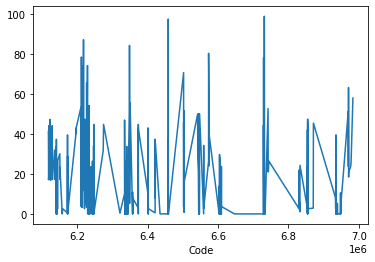

In [11]:
summarygapsstations.PercentageGaps.plot()

Here we can plot the gaps:

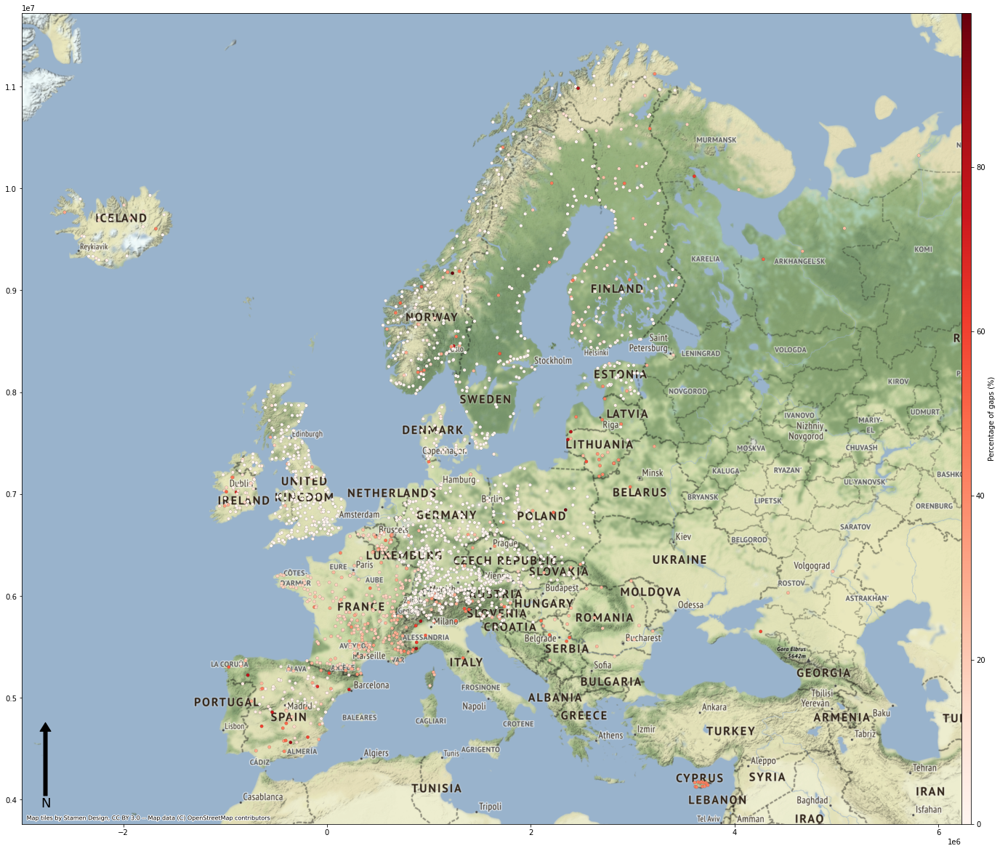

In [12]:
plot = geospatialfunctions.plotgapsmap(summarygapsstations = summarygapsstations, crsproj = 'epsg:4326', backmapproj = True, 
                                       figsizeproj = (23.4, 23.4), cmapproj = "Reds", legend_title = "Percentage of gaps (%)",
                                       legend_orientation = "vertical", pad_map = 0, markersize_map = 20,
                                       north_arrow = True, 
                                       set_map_limits = False, minx = -25, miny = 35, maxx = 30, maxy = 72)

#plot.savefig('world.jpg', bbox_inches='tight', dpi=300)
plot.show()

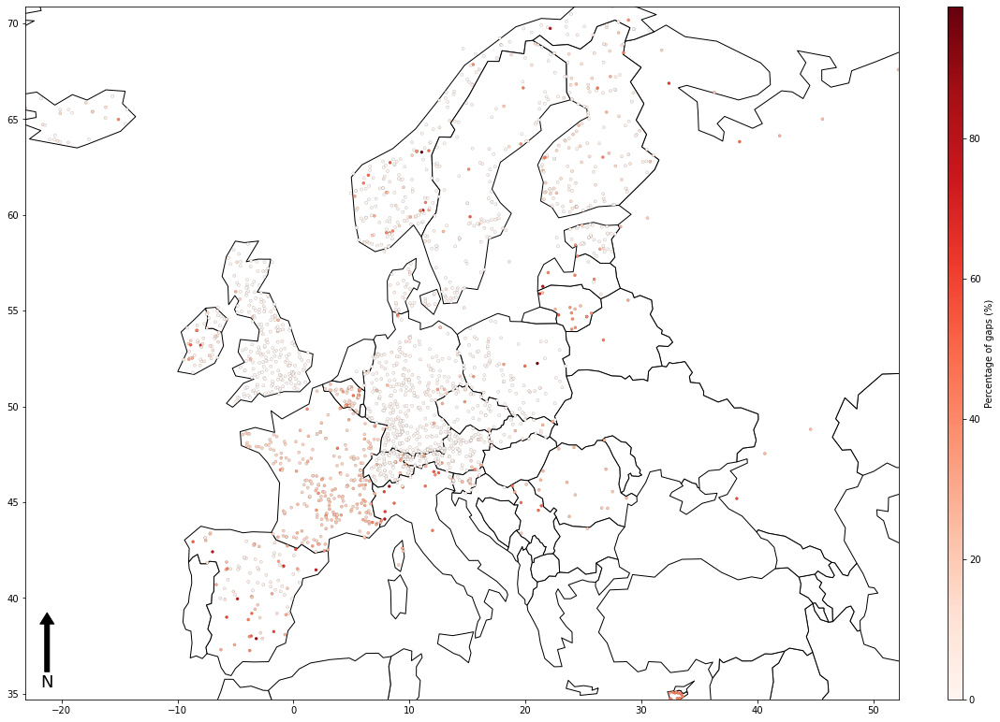

In [13]:
plot = geospatialfunctions.plotgapsmap(summarygapsstations = summarygapsstations, crsproj = 'epsg:4326', backmapproj = False, 
                                       figsizeproj = (23.4, 23.4), cmapproj = "Reds", legend_title = "Percentage of gaps (%)",
                                       legend_orientation = "vertical", pad_map = -3.5, markersize_map = 10,
                                       north_arrow = True, 
                                       set_map_limits = False, minx = -25, miny = 35, maxx = 30, maxy = 72)

#plot.savefig('world.jpg', bbox_inches='tight', dpi=300)
plot.show()

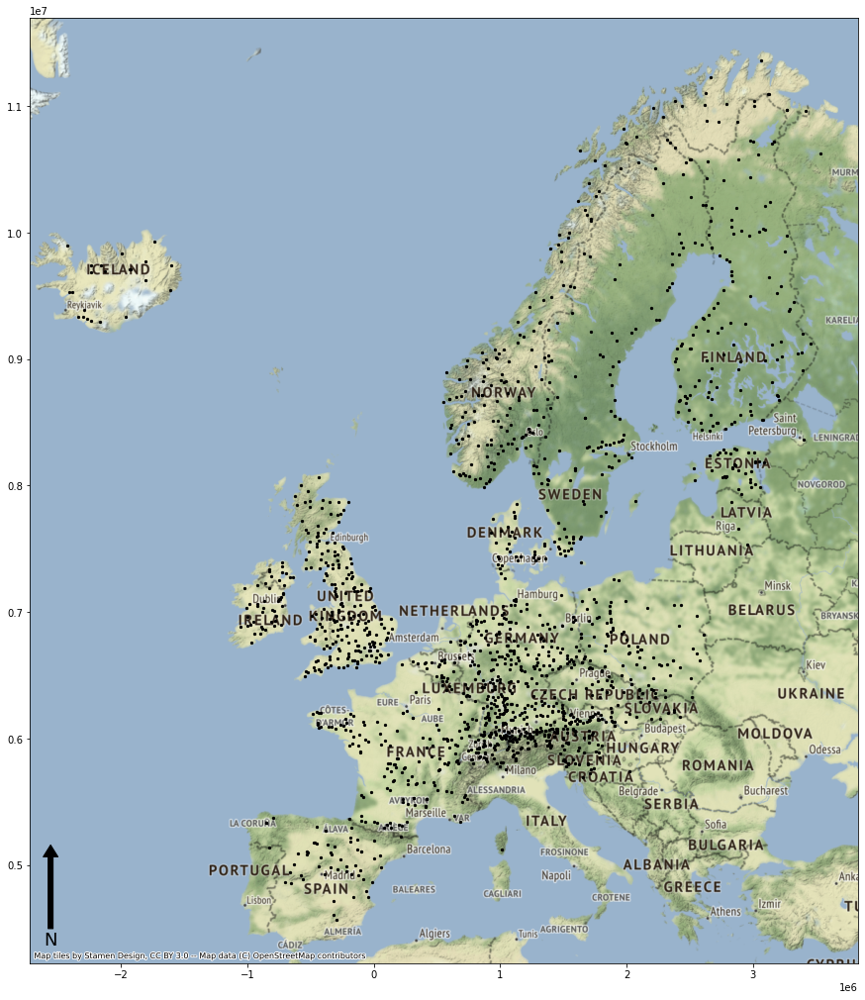

In [14]:
geospatialfunctions.plotpointsmap(summarygapsstations[summarygapsstations.PercentageGaps < 20.0], showcodes = False,  
                                  backmapproj = True,
                                  markersize_map = 5, 
                                  north_arrow = True, 
                                  set_map_limits = True,
                                  minx = -25, miny = 35, maxx = 30, maxy = 72)

Here we do not do any further modification, but we set the grdc number as the index:

In [15]:
network_cond_3 = network_cond_2.set_index("grdc_no")
network_cond_3

,wmo_reg,sub_reg,river,station,country,lat,long,area,altitude,d_start,...,m_start,m_end,m_yrs,m_miss,t_start,t_end,t_yrs,lta_discharge,r_volume_yr,r_height_yr
grdc_no,,,,,,,,,,,,,,,,,,,,,
6118130,6,6180,ABER VRAC'H,DRENNEC,FR,48.530410,-4.362693,24.0,90.60,1966-01-01,...,NaN,NaN,NaN,NaN,1966,2012,47,0.448,0.014128128,588.672
6118150,6,6180,GUILLEC,TREZILIDE,FR,48.615037,-4.077011,43.0,91.10,1966-01-01,...,NaN,NaN,NaN,NaN,1966,2012,47,0.682,0.021507552,500.1756279069768
6118160,6,6180,PENZE,TAULE (PENHOAT),FR,48.584822,-3.924127,141.0,61.97,1967-01-01,...,NaN,NaN,NaN,NaN,1967,2012,46,2.813,0.08871076800000001,629.1543829787234
6118165,6,6180,RISLE,RAI,FR,48.747942,0.580580,149.0,255.45,1965-01-01,...,NaN,NaN,NaN,NaN,1965,2012,48,1.379,0.043488144,291.8667382550336
6118175,6,6180,JARLOT,PLOUGONVEN,FR,48.565562,-3.800485,44.0,73.86,1966-01-01,...,NaN,NaN,NaN,NaN,1966,2012,47,0.712,0.022453632,510.3098181818181
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6971130,6,6712,TULOMA,VERKHNE-TULOMSKIY GES,RU,68.600000,31.750000,17500.0,-999.00,1935-01-01,...,1934.0,2017.0,84.0,25.349301,1934,2017,84,193.903,6.114925008,349.4242861714285
6971600,6,6713,VARZUGA,VARZUGA,RU,66.400000,36.300000,7940.0,9.00,1979-01-01,...,1935.0,1992.0,58.0,0.288600,1935,2011,77,91.75,2.893428,364.4115869017632
6977100,6,6771,VOLGA,VOLGOGRAD POWER PLANT,RU,48.804722,44.585833,1360000.0,-999.00,1962-01-01,...,1879.0,1984.0,106.0,17.924528,1879,2010,132,7827.676,246.853590336,181.5099928941177


In [16]:
summarygapsstations["Country"] = network_cond_3.country
summarygapsstations["area"] = network_cond_3.area
summarygapsstations["elevation"] = network_cond_3.altitude

# It is also improtant to replace any -999 data to NaN:
summarygapsstations.replace(-999.0, np.nan, inplace=True)
summarygapsstations["area"].replace(0, np.nan, inplace=True)

summarygapsstations

,CoordX,CoordY,NumGaps,PercentageGaps,geometry,Country,area,elevation
Code,,,,,,,,
6118130,-4.362693,48.530410,2412.0,17.378774,POINT (-4.36269 48.53041),FR,24.0,90.60
6118150,-4.077011,48.615037,2399.0,17.285107,POINT (-4.07701 48.61504),FR,43.0,91.10
6118160,-3.924127,48.584822,2408.0,17.349953,POINT (-3.92413 48.58482),FR,141.0,61.97
6118165,0.580580,48.747942,3486.0,25.117083,POINT (0.58058 48.74794),FR,149.0,255.45
6118175,-3.800485,48.565562,2578.0,18.574825,POINT (-3.80049 48.56556),FR,44.0,73.86
...,...,...,...,...,...,...,...,...
6971130,31.750000,68.600000,2558.0,18.430723,POINT (31.75000 68.60000),RU,17500.0,NaN
6971600,36.300000,66.400000,2922.0,21.053390,POINT (36.30000 66.40000),RU,7940.0,9.00
6977100,44.585833,48.804722,3287.0,23.683262,POINT (44.58583 48.80472),RU,1360000.0,NaN


In [17]:
summarygapsstations["area"].min()

0.1

Here we can plot our dataset with the circles proportional to their respective catchment area:

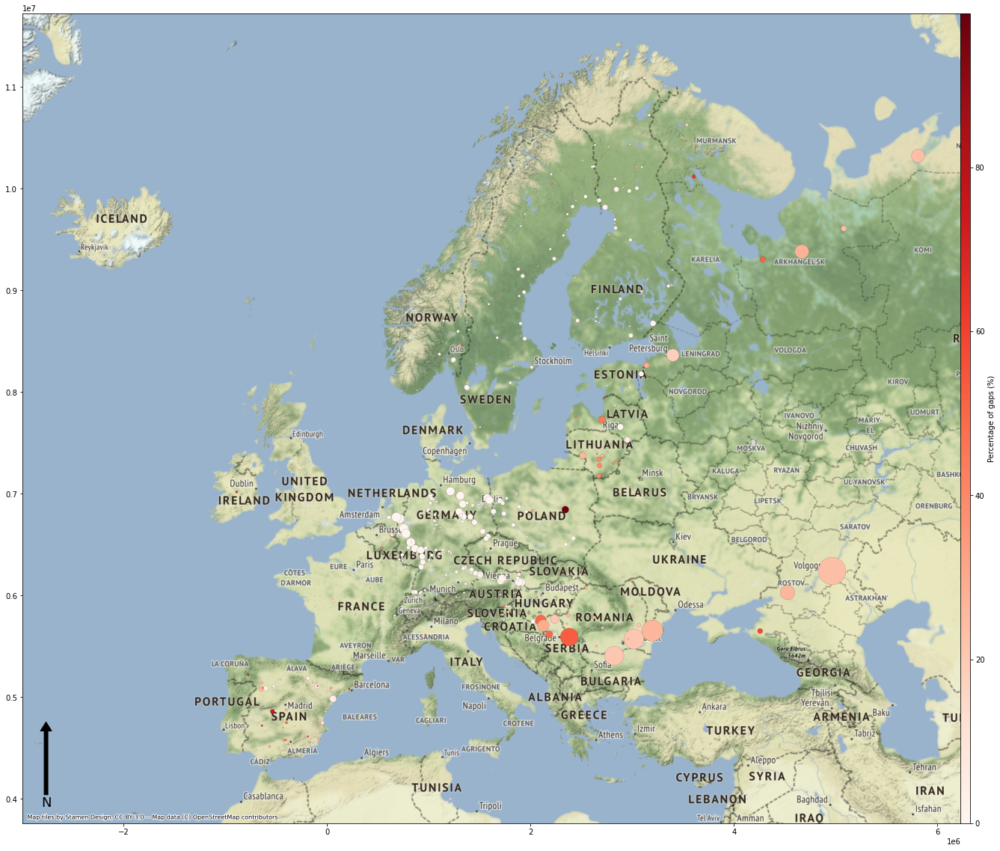

In [18]:
plot = geospatialfunctions.plotgapsmap(summarygapsstations = summarygapsstations,
                                       crsproj = 'epsg:4326', backmapproj = True, 
                                       figsizeproj = (22.7, 22.7), cmapproj = "Reds", legend_title = "Percentage of gaps (%)",
                                       legend_orientation = "vertical", pad_map = 0, linewidth_marker = 0.1,
                                       markersize_map = summarygapsstations['area']/1000,
                                       north_arrow = True, 
                                       set_map_limits = False, minx = -11, miny = 50, maxx = -6, maxy = 56)

#plot.savefig('world.jpg', bbox_inches='tight', dpi=300)
plot.show()

In [19]:
summarygapsstations

,CoordX,CoordY,NumGaps,PercentageGaps,geometry,Country,area,elevation
Code,,,,,,,,
6118130,-4.362693,48.530410,2412.0,17.378774,POINT (-4.36269 48.53041),FR,24.0,90.60
6118150,-4.077011,48.615037,2399.0,17.285107,POINT (-4.07701 48.61504),FR,43.0,91.10
6118160,-3.924127,48.584822,2408.0,17.349953,POINT (-3.92413 48.58482),FR,141.0,61.97
6118165,0.580580,48.747942,3486.0,25.117083,POINT (0.58058 48.74794),FR,149.0,255.45
6118175,-3.800485,48.565562,2578.0,18.574825,POINT (-3.80049 48.56556),FR,44.0,73.86
...,...,...,...,...,...,...,...,...
6971130,31.750000,68.600000,2558.0,18.430723,POINT (31.75000 68.60000),RU,17500.0,NaN
6971600,36.300000,66.400000,2922.0,21.053390,POINT (36.30000 66.40000),RU,7940.0,9.00
6977100,44.585833,48.804722,3287.0,23.683262,POINT (44.58583 48.80472),RU,1360000.0,NaN


<AxesSubplot:>

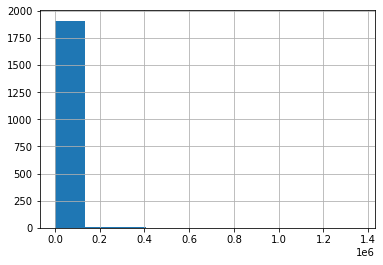

In [20]:
summarygapsstations.area.hist()

In [21]:
summarygapsstations.describe()

,CoordX,CoordY,NumGaps,PercentageGaps,area,elevation
count,1943.000000,1943.000000,1943.000000,1943.000000,1.925000e+03,1756.000000
mean,9.564295,52.603498,1207.627895,8.701116,7.675116e+03,275.753258
std,10.023693,7.151614,1949.365910,14.045435,4.930137e+04,329.107395
min,-23.127190,34.708333,0.000000,0.000000,1.000000e-01,-1.080000
25%,2.442273,47.504136,0.000000,0.000000,1.354000e+02,42.227250
50%,9.456837,51.097604,85.000000,0.612436,4.237000e+02,155.000000
75%,15.419385,58.206834,2350.000000,16.932056,2.107000e+03,395.530000
max,52.170000,70.879230,13711.000000,98.789538,1.360000e+06,2065.900000


<AxesSubplot:>

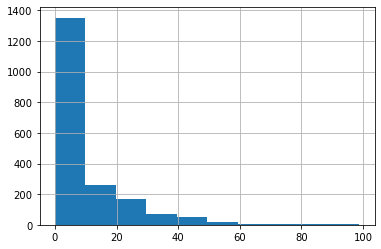

In [22]:
summarygapsstations.PercentageGaps.hist()

Here we can check the amount of stations and percentage of errors per country:

In [108]:
stationsdescribe =pd.DataFrame()
stationsdescribe["stations"] = summarygapsstations.loc[:,["PercentageGaps", "Country"]].groupby(by=["Country"]).count()
stationsdescribe["min"] = summarygapsstations.loc[:,["PercentageGaps", "Country"]].groupby(by=["Country"]).min()
stationsdescribe["P25"] = summarygapsstations.loc[:,["PercentageGaps", "Country"]].groupby(by=["Country"]).quantile(q = 0.25)
stationsdescribe["P50"] = summarygapsstations.loc[:,["PercentageGaps", "Country"]].groupby(by=["Country"]).quantile(q = 0.50)
stationsdescribe["mean"] = summarygapsstations.loc[:,["PercentageGaps", "Country"]].groupby(by=["Country"]).mean()
stationsdescribe["P75"] = summarygapsstations.loc[:,["PercentageGaps", "Country"]].groupby(by=["Country"]).quantile(q = 0.75)
stationsdescribe["max"] = summarygapsstations.loc[:,["PercentageGaps", "Country"]].groupby(by=["Country"]).max()

stationsdescribe

,stations,min,P25,P50,mean,P75,max
Country,,,,,,,
BE,37,2.629872,15.786440,15.786440,20.879298,26.644571,47.366525
BY,2,31.572880,34.865624,38.158369,38.158369,41.451113,44.743858
CH,81,0.000000,0.000000,0.000000,3.951969,0.000000,39.476908
CY,12,40.139780,40.183010,42.769652,41.917045,42.771453,42.985806
CZ,28,0.000000,0.000000,0.000000,3.085854,0.000000,37.279343
DE,320,0.000000,0.000000,0.000000,1.858924,0.471936,46.927012
DK,32,0.000000,2.629872,2.629872,3.040115,2.629872,12.666619
EE,39,0.000000,0.000000,0.000000,3.548249,0.000000,39.469702
ES,92,3.292744,3.858347,7.900425,19.245372,30.097630,87.052381


#### a. Some observation about the countries:

BE (Belgium): Official data downloaded;

BY (Belarus): Only one long-term station;

CH (Switzerland): Camels data downloaded;

CY (Cyprus): Data until only the 2005s;

CZ (Czechia): Good amount of long-term data;

DE (Germany): Good amount of long-term data (even longer if needed);

DK (Denmark): Good amount of long-term data;

EE (Estonia): Good amount of long-term data;

ES (Spain): Official data downloaded;

FI (Finland): Good amount of long-term data until 2019;

FR (France): Official data downloaded;

GB (Great Britain): Camels + official data downloaded;

HR (Croatia): Only one station, but no gaps;

IE (Ireland): Many gaps, but overal good time-range;

IS (Iceland): Some gaps, but overal good time-range;

IT (Italy): Really bad situation. Many of the available data is in the upper north, where the Camels CH already covers;

LT (Lithuania): Some gaps, but data reach up to 2010;

LV (Latvia): Only some stations with long term.

NL (The Netherlands): 3 out of 6 with long term time-series and little gaps (data until 2020);

NO (Norway): Good amount of data. They reach untill 2020, and there are some gaps.

PL (Poland): Good amount of long-term data and little gaps;

RO (Romania): Data goes until 2011, but there are little gaps;

RS (Serbia): Data goes untill 2011, but there are only 3 out of 6 stations without major gaps. 

RU (Russia): Some gaps and data goes until 2012.

SE (Sweden): Official data downloaded;

SI ( Slovenia): Good amount of long term data. 

SK ( Slovakia): Good amount of long term data, but it goes only until 2018. 

Here we can plot the Gannt chart for our dataset:

<module 'matplotlib.pyplot' from 'C:\\Users\\nascimth\\AppData\\Local\\miniconda3\\envs\\geopandas\\lib\\site-packages\\matplotlib\\pyplot.py'>

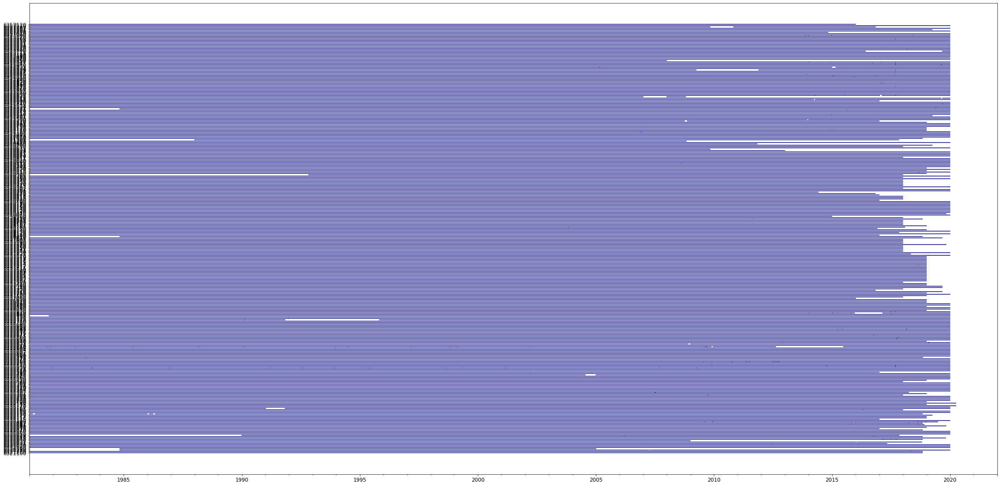

In [86]:
idcondition = summarygapsstations[summarygapsstations.Country == "DE"].index.tolist()
timeseriesfinal_gantt = timeseriesfinal_used.loc["1981":"2021", idcondition]

geospatialfunctions.plotganntchart(timeseriesfinal_gantt = timeseriesfinal_gantt, figsize_chart = (40, 20), 
             color_chart = "navy", fontsize_chart = 12,facecolor_chart = "white")

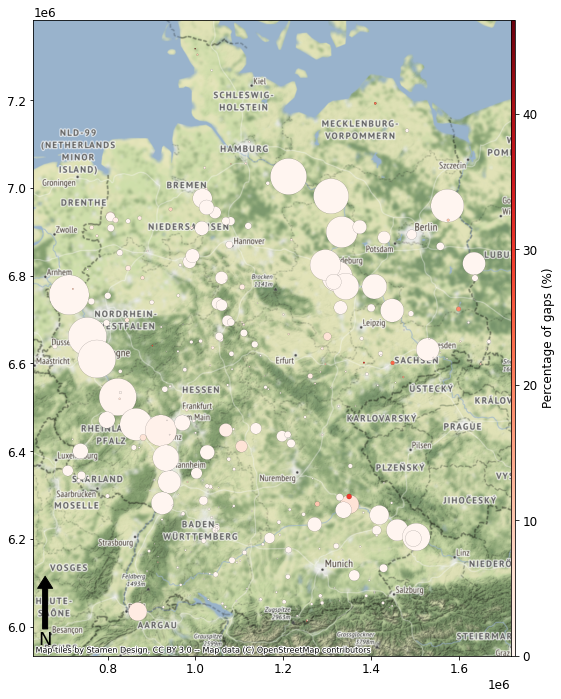

In [87]:
summarygapsstations_used = summarygapsstations[summarygapsstations.Country == "DE"]


plot = geospatialfunctions.plotgapsmap(summarygapsstations = summarygapsstations_used,
                                       crsproj = 'epsg:4326', backmapproj = True, 
                                       figsizeproj = (11.7, 11.7), cmapproj = "Reds", legend_title = "Percentage of gaps (%)",
                                       legend_orientation = "vertical", pad_map = 0, markersize_map = summarygapsstations_used.area/100,
                                       north_arrow = True, 
                                       set_map_limits = False, minx = -25, miny = 35, maxx = 30, maxy = 72)

#plot.savefig('world.jpg', bbox_inches='tight', dpi=300)
plot.show()

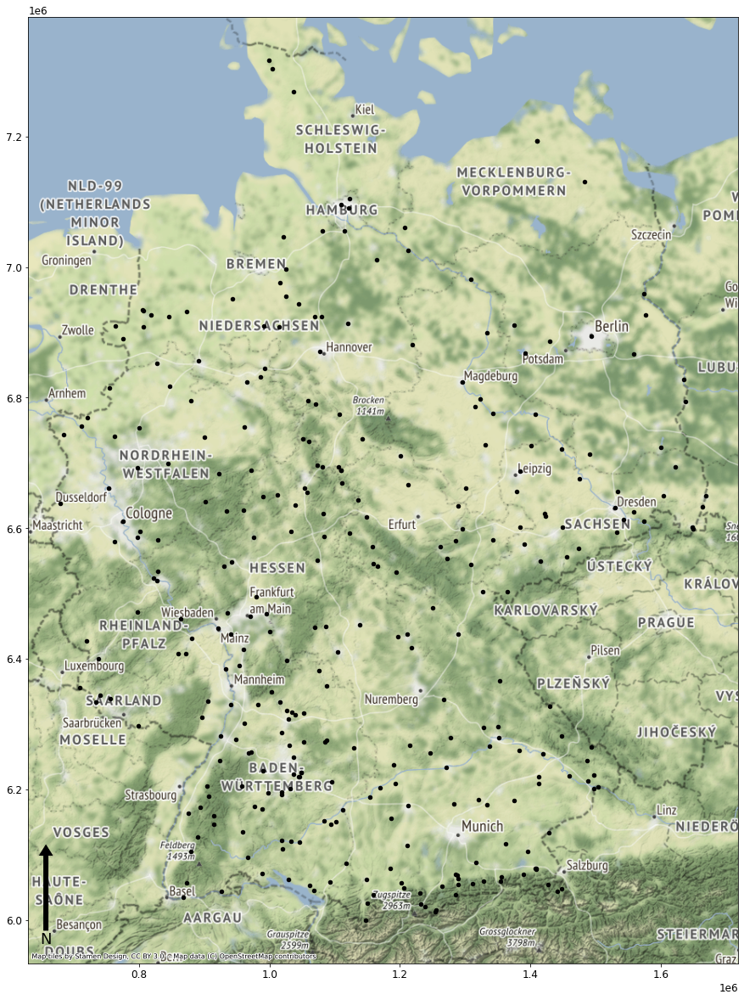

In [88]:
geospatialfunctions.plotpointsmap(summarygapsstations[summarygapsstations.Country == "DE"], showcodes = False,  
                                  backmapproj = True,
                                  markersize_map = 20, 
                                  north_arrow = True, 
                                  set_map_limits = False,
                                  minx = -25, miny = 35, maxx = 30, maxy = 72)

5. At this point we can convert our streamflow dataset from m3/s to mm/day

But first it is interesting to check the number of catchments without area:

In [26]:
print("There are", summarygapsstations.area.isna().sum(), "stations without area assigned in our dataframe")

There are 17 stations without area assigned in our dataframe


Now we proceed with the conversion:

In [48]:
#%% #### 1. Define a function to convert streamflow from cubic meters per seconds (m3/s) to milimiters per day (mm/day):

def Q_from_m3s_mmday(timeseries_m3s, stations_infos):
    """
    Inputs
    ------------------
    timeseries_m3s = dataframe[Index = Datetime; columns = [stations-codes]]; 
    stations_infos = dataframe[Index = [stations-codes]; columns = [...,....,area]];
    
    Returns
    --------------------
    timeseries_mmday = dataframe[Index = Datetime; columns = [stations-codes]] 
        
    """   
    timeseries_mmday = (timeseries_m3s * 1000 * 24 * 3600) / (stations_infos.loc[timeseries_m3s.columns, "area"] * 1000 * 1000)
    
    return timeseries_mmday

In [49]:
timeseries_mmday = Q_from_m3s_mmday(timeseries_m3s = timeseriesfinal_used, stations_infos = summarygapsstations)
timeseries_mmday.loc[datetime.date(1981, 10, 1):datetime.date(2021, 9, 30), :]

,6118130,6118150,6118160,6118165,6118175,6118185,6118195,6118205,6118230,6119010,...,6970100,6970250,6970500,6970700,6970869,6971130,6971600,6977100,6978250,6983350
1981-10-01,2.1960,3.255070,1.605447,0.405906,0.893455,0.168585,0.696686,1.653791,NaN,1.795107,...,0.279210,0.412138,0.539234,0.991385,0.607135,1.017051,1.371083,0.344329,0.137829,0.616116
1981-10-02,2.1708,3.074233,0.955915,0.405906,0.693164,0.222322,0.602057,1.706798,NaN,1.811883,...,0.279210,0.414621,0.586723,1.002462,0.553761,0.794880,1.316675,0.347506,0.140571,0.616116
1981-10-03,1.0692,1.336186,0.686298,0.405906,0.551782,0.145405,0.569143,1.473571,NaN,1.677670,...,0.266801,0.419586,0.626553,1.010769,0.577112,0.710949,1.196977,0.362753,0.133943,0.619709
1981-10-04,0.9108,0.769563,0.588255,0.371114,0.471273,0.121171,0.522514,1.420564,NaN,1.556878,...,0.257494,0.417103,0.652596,1.019077,0.480371,0.735634,1.077280,0.371012,0.134629,0.616116
1981-10-05,0.8640,0.649005,0.416681,0.440698,0.422182,0.104312,0.469029,1.367558,NaN,1.469639,...,0.249738,0.414621,0.652596,1.030154,0.560432,0.908434,1.022872,0.375459,0.137829,0.610728
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2021-09-26,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2021-09-27,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2021-09-28,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2021-09-29,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [87]:
summarygapsstations

,CoordX,CoordY,NumGaps,PercentageGaps,geometry,Country,area,elevation
Code,,,,,,,,
6118130,-4.362693,48.530410,2412.0,17.378774,POINT (-4.36269 48.53041),FR,24.0,90.60
6118150,-4.077011,48.615037,2399.0,17.285107,POINT (-4.07701 48.61504),FR,43.0,91.10
6118160,-3.924127,48.584822,2408.0,17.349953,POINT (-3.92413 48.58482),FR,141.0,61.97
6118165,0.580580,48.747942,3486.0,25.117083,POINT (0.58058 48.74794),FR,149.0,255.45
6118175,-3.800485,48.565562,2578.0,18.574825,POINT (-3.80049 48.56556),FR,44.0,73.86
...,...,...,...,...,...,...,...,...
6971130,31.750000,68.600000,2558.0,18.430723,POINT (31.75000 68.60000),RU,17500.0,NaN
6971600,36.300000,66.400000,2922.0,21.053390,POINT (36.30000 66.40000),RU,7940.0,9.00
6977100,44.585833,48.804722,3287.0,23.683262,POINT (44.58583 48.80472),RU,1360000.0,NaN


In [109]:
idcondition = summarygapsstations[summarygapsstations.Country == "BY"].index.tolist()

timeseriesfinalcondition = timeseriesfinal_used.loc["1981":"2021", idcondition]
timeseriesfinalcondition

,6273500,6274600
1981-01-01,9.0,NaN
1981-01-02,10.0,NaN
1981-01-03,10.0,NaN
1981-01-04,10.0,NaN
1981-01-05,9.0,NaN
...,...,...
2021-12-27,NaN,NaN
2021-12-28,NaN,NaN
2021-12-29,NaN,NaN
2021-12-30,NaN,NaN


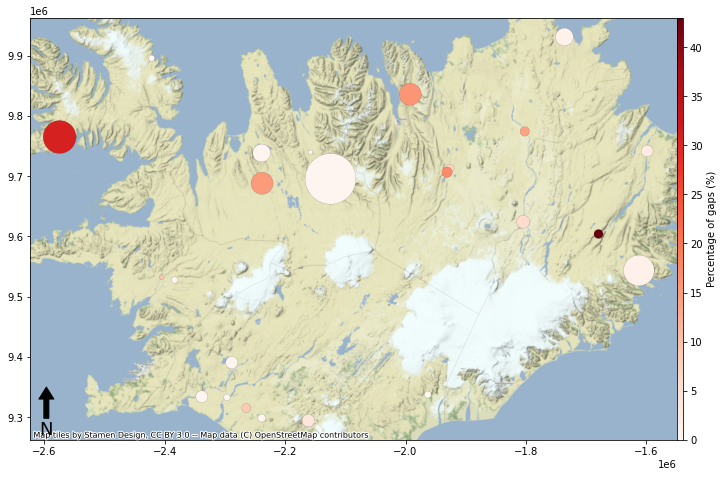

In [119]:
plot = geospatialfunctions.plotgapsmap(summarygapsstations = summarygapsstations[summarygapsstations.Country == "IS"],
                                       crsproj = 'epsg:4326', backmapproj = True, 
                                       figsizeproj = (11.7, 11.7), cmapproj = "Reds", legend_title = "Percentage of gaps (%)",
                                       legend_orientation = "vertical", pad_map = 0, markersize_map = summarygapsstations['area'],
                                       north_arrow = True, 
                                       set_map_limits = False, minx = -25, miny = 35, maxx = 30, maxy = 72)

#plot.savefig('world.jpg', bbox_inches='tight', dpi=300)
plot.show()

In [17]:
idcondition = summarygapsstations[summarygapsstations.Country == "IS"].index.tolist()

timeseriesfinalcondition = timeseriesfinal_used.loc["1981":"2021", idcondition]
timeseriesfinalcondition

,6401070,6401080,6401090,6401111,6401120,6401130,6401140,6401150,6401160,6401200,...,6401400,6401440,6401460,6401500,6401600,6401601,6401610,6401702,6401703,6401800
1981-01-01,4.31,60.02,273.80,53.56,246.37,1.74,14.1,34.44,0.244,11.60,...,19.22,NaN,7.0,5.59,NaN,4.74,NaN,NaN,NaN,0.00
1981-01-02,4.31,60.60,270.08,54.88,260.29,1.74,14.0,34.44,0.236,10.90,...,18.41,NaN,7.0,5.39,NaN,4.62,NaN,NaN,NaN,0.00
1981-01-03,4.31,60.60,273.80,54.88,262.66,1.74,14.0,34.44,0.229,9.79,...,18.41,NaN,7.0,5.39,NaN,4.60,NaN,NaN,NaN,0.00
1981-01-04,4.31,60.60,273.80,53.56,277.14,1.64,14.0,35.38,0.228,10.90,...,19.22,NaN,7.0,5.18,NaN,4.62,NaN,NaN,NaN,0.00
1981-01-05,4.84,60.60,277.53,50.96,274.69,1.64,14.0,35.38,0.227,12.00,...,18.41,NaN,7.0,5.18,NaN,4.62,NaN,NaN,NaN,0.00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2021-12-27,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,209.41
2021-12-28,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,204.71
2021-12-29,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,185.75
2021-12-30,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,177.07


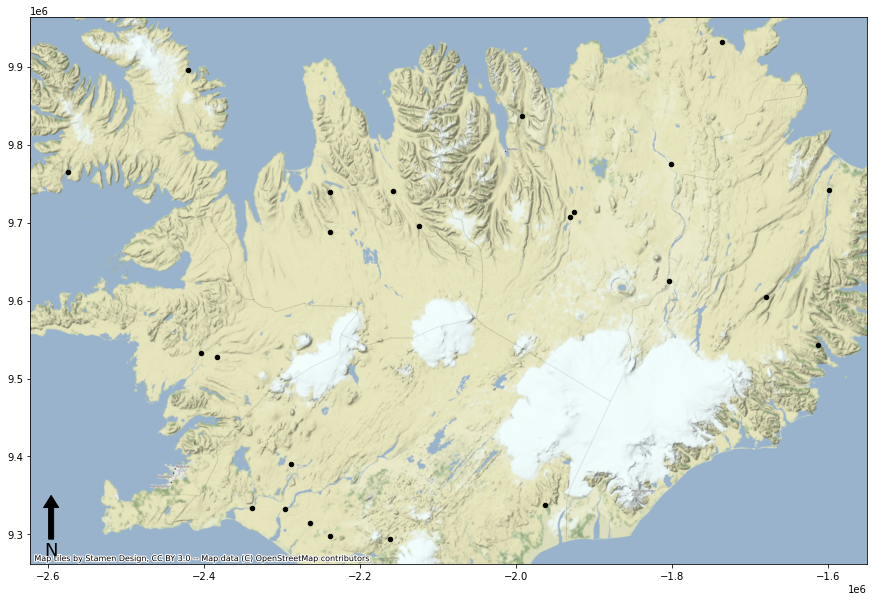

In [18]:
geospatialfunctions.plotpointsmap(summarygapsstations[summarygapsstations.Country == "IS"], showcodes = False,  
                                  backmapproj = True,
                                  markersize_map = 20, 
                                  north_arrow = True, 
                                  set_map_limits = False,
                                  minx = -25, miny = 35, maxx = 30, maxy = 72)

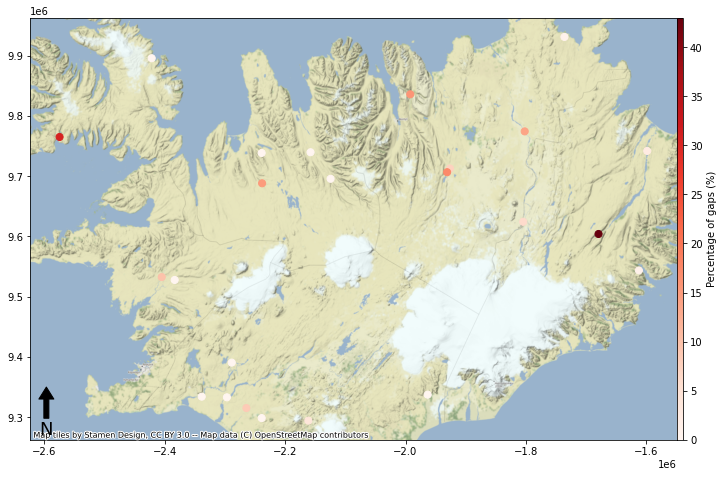

In [19]:
plot = geospatialfunctions.plotgapsmap(summarygapsstations = summarygapsstations[summarygapsstations.Country == "IS"],
                                       crsproj = 'epsg:4326', backmapproj = True, 
                                       figsizeproj = (11.7, 11.7), cmapproj = "Reds", legend_title = "Percentage of gaps (%)",
                                       legend_orientation = "vertical", pad_map = 0, markersize_map = 50,
                                       north_arrow = True, 
                                       set_map_limits = False, minx = -25, miny = 35, maxx = 30, maxy = 72)

#plot.savefig('world.jpg', bbox_inches='tight', dpi=300)
plot.show()

In [20]:
timeseriesfinalcondition

,6401070,6401080,6401090,6401111,6401120,6401130,6401140,6401150,6401160,6401200,...,6401400,6401440,6401460,6401500,6401600,6401601,6401610,6401702,6401703,6401800
1981-01-01,4.31,60.02,273.80,53.56,246.37,1.74,14.1,34.44,0.244,11.60,...,19.22,NaN,7.0,5.59,NaN,4.74,NaN,NaN,NaN,0.00
1981-01-02,4.31,60.60,270.08,54.88,260.29,1.74,14.0,34.44,0.236,10.90,...,18.41,NaN,7.0,5.39,NaN,4.62,NaN,NaN,NaN,0.00
1981-01-03,4.31,60.60,273.80,54.88,262.66,1.74,14.0,34.44,0.229,9.79,...,18.41,NaN,7.0,5.39,NaN,4.60,NaN,NaN,NaN,0.00
1981-01-04,4.31,60.60,273.80,53.56,277.14,1.64,14.0,35.38,0.228,10.90,...,19.22,NaN,7.0,5.18,NaN,4.62,NaN,NaN,NaN,0.00
1981-01-05,4.84,60.60,277.53,50.96,274.69,1.64,14.0,35.38,0.227,12.00,...,18.41,NaN,7.0,5.18,NaN,4.62,NaN,NaN,NaN,0.00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2021-12-27,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,209.41
2021-12-28,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,204.71
2021-12-29,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,185.75
2021-12-30,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,177.07


In [21]:
summarygapsstations

,CoordX,CoordY,NumGaps,PercentageGaps,geometry,Country,area
Code,,,,,,,
6118130,-4.362693,48.530410,2412.0,17.378774,POINT (-4.36269 48.53041),FR,24.0
6118150,-4.077011,48.615037,2399.0,17.285107,POINT (-4.07701 48.61504),FR,43.0
6118160,-3.924127,48.584822,2408.0,17.349953,POINT (-3.92413 48.58482),FR,141.0
6118165,0.580580,48.747942,3486.0,25.117083,POINT (0.58058 48.74794),FR,149.0
6118175,-3.800485,48.565562,2578.0,18.574825,POINT (-3.80049 48.56556),FR,44.0
...,...,...,...,...,...,...,...
6971130,31.750000,68.600000,2558.0,18.430723,POINT (31.75000 68.60000),RU,17500.0
6971600,36.300000,66.400000,2922.0,21.053390,POINT (36.30000 66.40000),RU,7940.0
6977100,44.585833,48.804722,3287.0,23.683262,POINT (44.58583 48.80472),RU,1360000.0


<module 'matplotlib.pyplot' from 'C:\\Users\\nascimth\\AppData\\Local\\miniconda3\\envs\\geopandas\\lib\\site-packages\\matplotlib\\pyplot.py'>

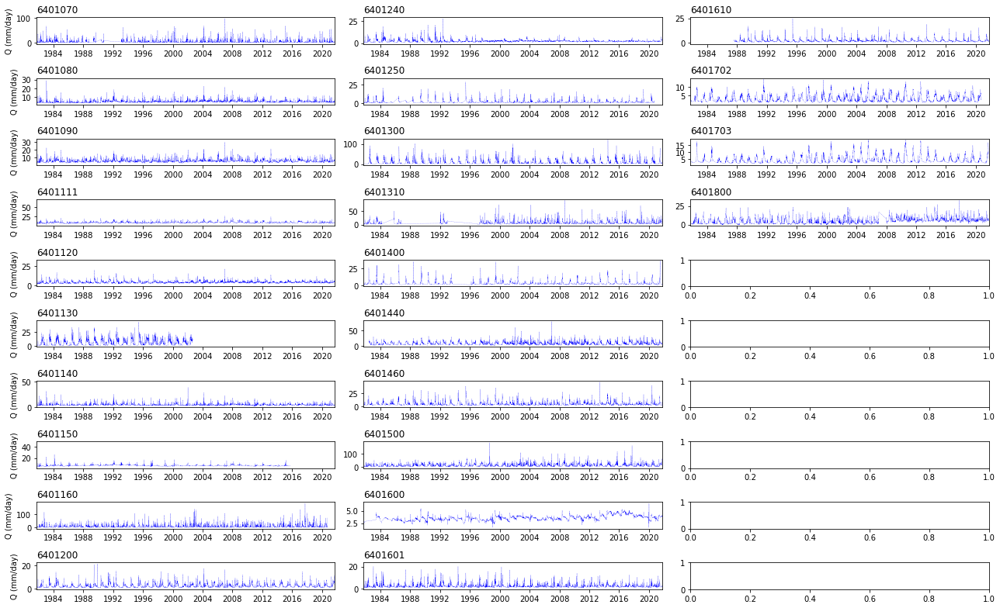

In [26]:
geospatialfunctions.plottimeseries(numr = 10, numc = 3, datatoplot = timeseries_mmday.loc[:, timeseriesfinalcondition.columns], 
                                   setylim = False, ymin = 0, ymax = 200, figsizeproj = (18, 11),
                                   colorgraph = "blue", linewidthproj = 0.2, linestyleproj = "-.",  
                                   ylabelplot = "Q (mm/day)", 
                                   datestart = datetime.date(1981, 10, 1), dateend = datetime.date(2021, 9, 30),
                                   setnumberofintervals = False, numberintervals = 2,
                                   fontsize_plot = 10)

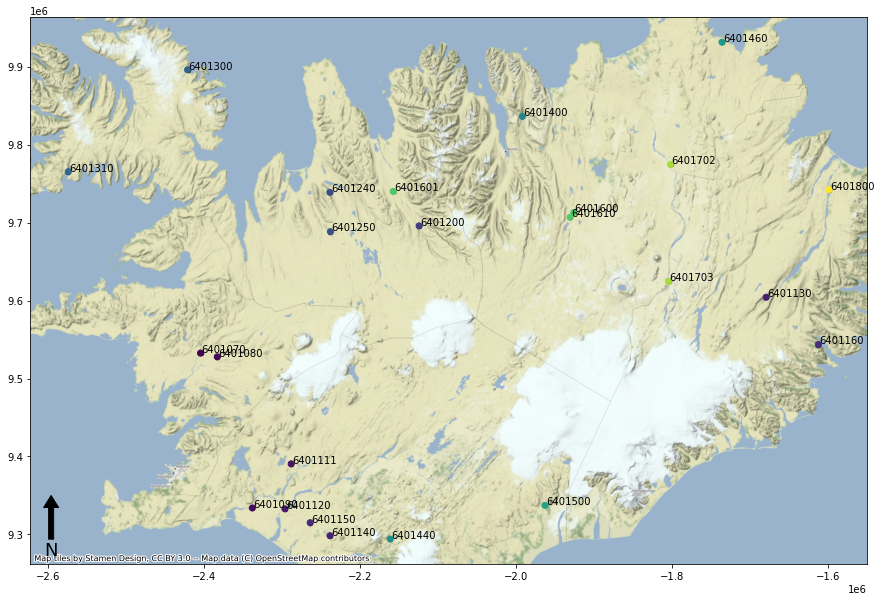

In [27]:
geospatialfunctions.plotpointsmap(summarygapsstations[summarygapsstations.Country == "IS"], showcodes = True,  
                                  backmapproj = True,
                                  markersize_map = 20, 
                                  north_arrow = True, 
                                  set_map_limits = False,
                                  minx = -25, miny = 35, maxx = 30, maxy = 72)

Let's check our dataset for Ireland:

In [28]:
idcondition = summarygapsstations[summarygapsstations.Country == "IE"].index.tolist()

timeseriesfinalcondition = timeseriesfinal_used.loc["1981":"2021", idcondition]
timeseriesfinalcondition

,6502101,6502110,6502141,6502150,6502151,6502160,6502170,6502171,6502810,6503100,...,6503370,6503400,6503410,6503500,6503501,6503800,6503851,6503852,6503853,6503855
1981-01-01,NaN,NaN,33.18,42.48,37.06,35.35,NaN,28.728,11.72,195.340,...,8.06,NaN,5.04,77.68,40.91,3.04,60.25,52.24,26.85,26.88
1981-01-02,NaN,NaN,30.88,38.05,33.11,34.41,NaN,27.619,10.99,185.767,...,7.37,NaN,5.02,74.28,38.46,2.93,56.21,45.27,26.67,25.22
1981-01-03,NaN,NaN,29.83,34.06,30.00,33.14,NaN,25.280,10.94,189.881,...,6.93,NaN,5.24,74.69,42.89,2.95,54.94,38.12,25.55,25.49
1981-01-04,NaN,NaN,28.23,30.63,26.66,32.21,NaN,23.166,10.06,183.198,...,6.66,NaN,4.98,74.04,37.24,2.49,50.87,34.47,23.72,23.70
1981-01-05,NaN,NaN,26.01,27.72,23.95,30.93,NaN,21.738,9.32,173.074,...,6.04,NaN,4.61,67.30,34.49,2.13,47.09,30.58,21.64,21.70
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2021-12-27,NaN,NaN,NaN,NaN,36.38,NaN,NaN,NaN,NaN,112.700,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2021-12-28,NaN,NaN,NaN,NaN,39.08,NaN,NaN,NaN,NaN,115.970,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2021-12-29,NaN,NaN,NaN,NaN,42.29,NaN,NaN,NaN,NaN,109.440,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2021-12-30,NaN,NaN,NaN,NaN,45.73,NaN,NaN,NaN,NaN,117.250,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


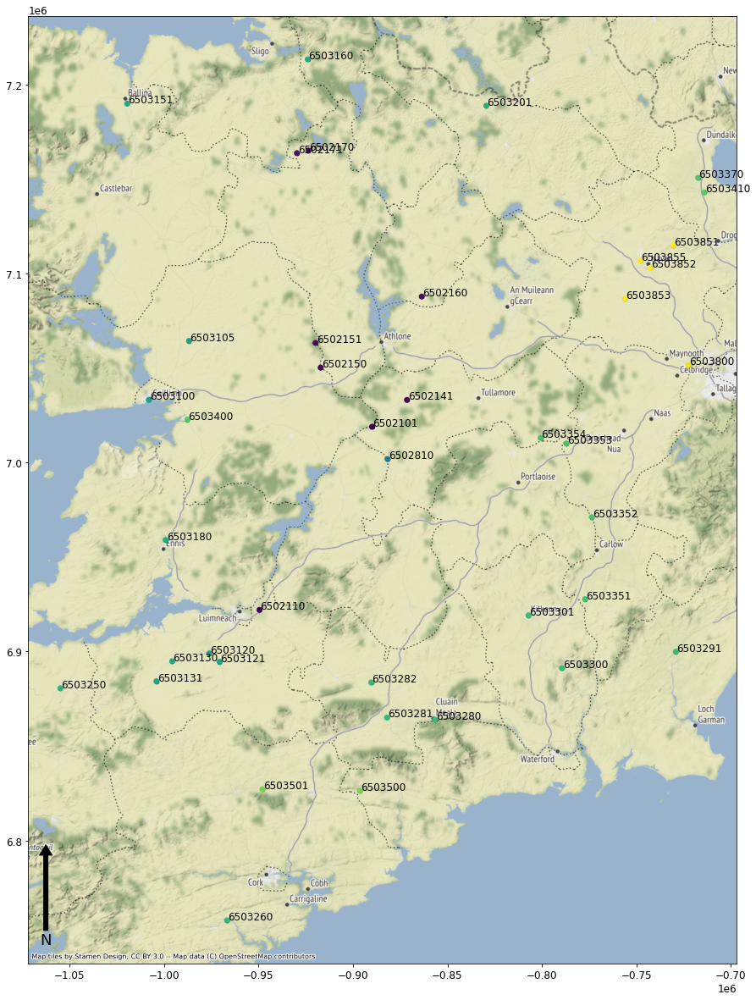

In [29]:
geospatialfunctions.plotpointsmap(summarygapsstations[summarygapsstations.Country == "IE"], showcodes = True,  
                                  backmapproj = True,
                                  markersize_map = 20, 
                                  north_arrow = True, 
                                  set_map_limits = False,
                                  minx = -25, miny = 35, maxx = 30, maxy = 72)

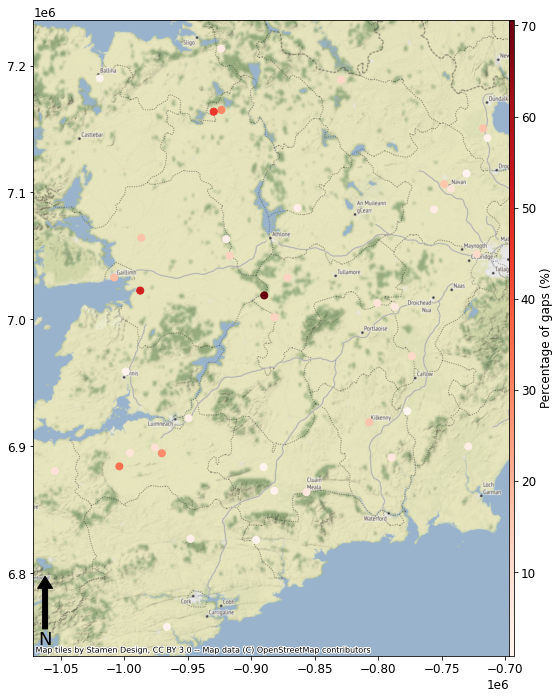

In [34]:
plot = geospatialfunctions.plotgapsmap(summarygapsstations = summarygapsstations[summarygapsstations.Country == "IE"],
                                       crsproj = 'epsg:4326', backmapproj = True, 
                                       figsizeproj = (11.7, 11.7), cmapproj = "Reds", legend_title = "Percentage of gaps (%)",
                                       legend_orientation = "vertical", pad_map = 0, markersize_map = 50,
                                       north_arrow = True, 
                                       set_map_limits = False, minx = -11, miny = 50, maxx = -6, maxy = 56)

#plot.savefig('world.jpg', bbox_inches='tight', dpi=300)
plot.show()

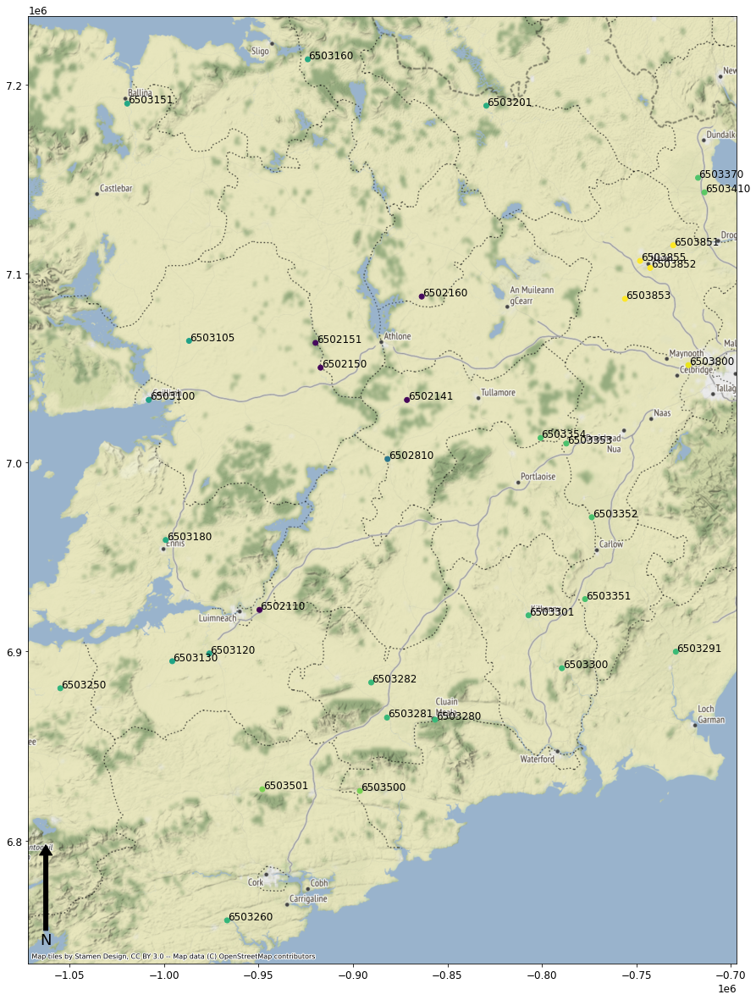

In [43]:
summarygapsstations_to_plot = summarygapsstations[summarygapsstations.Country == "IE"]

geospatialfunctions.plotpointsmap(summarygapsstations_to_plot[summarygapsstations_to_plot.PercentageGaps < 20.0],
                                  showcodes = True,  
                                  backmapproj = True,
                                  markersize_map = 5, 
                                  north_arrow = True, 
                                  set_map_limits = False,
                                  minx = -25, miny = 35, maxx = 30, maxy = 72)

In [44]:
idcondition = summarygapsstations_to_plot[summarygapsstations_to_plot.PercentageGaps < 20.0].index.tolist()

timeseriesfinalcondition = timeseriesfinal_used.loc["1981":"2021", idcondition]
timeseriesfinalcondition

,6502110,6502141,6502150,6502151,6502160,6502810,6503100,6503105,6503120,6503130,...,6503354,6503370,6503410,6503500,6503501,6503800,6503851,6503852,6503853,6503855
1981-01-01,NaN,33.18,42.48,37.06,35.35,11.72,195.340,25.16,15.08,8.37,...,10.31,8.06,5.04,77.68,40.91,3.04,60.25,52.24,26.85,26.88
1981-01-02,NaN,30.88,38.05,33.11,34.41,10.99,185.767,22.68,14.58,8.84,...,8.71,7.37,5.02,74.28,38.46,2.93,56.21,45.27,26.67,25.22
1981-01-03,NaN,29.83,34.06,30.00,33.14,10.94,189.881,21.62,14.47,14.69,...,9.29,6.93,5.24,74.69,42.89,2.95,54.94,38.12,25.55,25.49
1981-01-04,NaN,28.23,30.63,26.66,32.21,10.06,183.198,19.68,12.46,10.76,...,7.45,6.66,4.98,74.04,37.24,2.49,50.87,34.47,23.72,23.70
1981-01-05,NaN,26.01,27.72,23.95,30.93,9.32,173.074,17.44,11.25,9.35,...,6.78,6.04,4.61,67.30,34.49,2.13,47.09,30.58,21.64,21.70
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2021-12-27,NaN,NaN,NaN,36.38,NaN,NaN,112.700,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2021-12-28,NaN,NaN,NaN,39.08,NaN,NaN,115.970,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2021-12-29,NaN,NaN,NaN,42.29,NaN,NaN,109.440,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2021-12-30,NaN,NaN,NaN,45.73,NaN,NaN,117.250,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


<module 'matplotlib.pyplot' from 'C:\\Users\\nascimth\\AppData\\Local\\miniconda3\\envs\\geopandas\\lib\\site-packages\\matplotlib\\pyplot.py'>

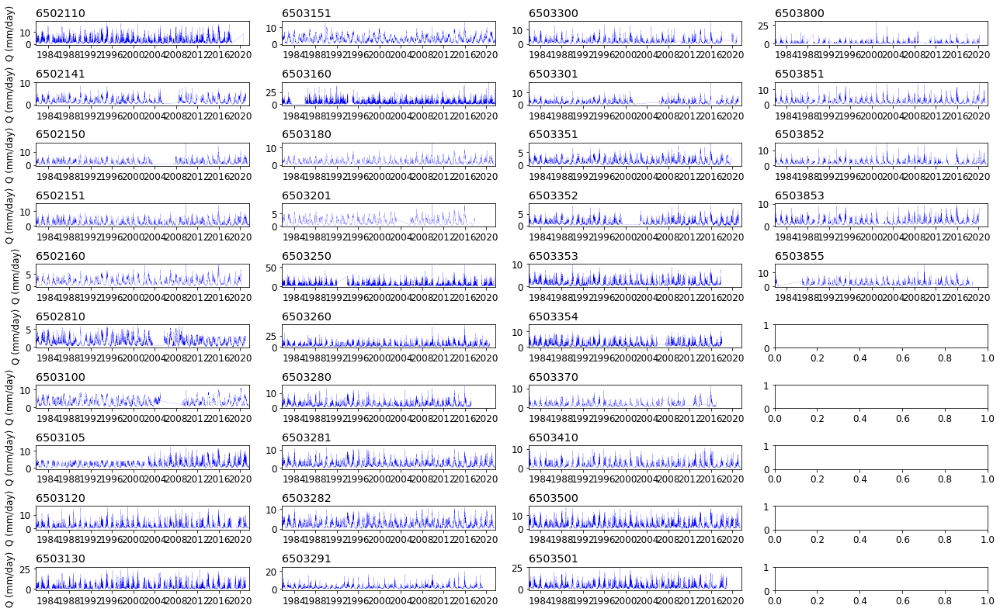

In [45]:
geospatialfunctions.plottimeseries(numr = 10, numc = 4, datatoplot = timeseries_mmday.loc[:, timeseriesfinalcondition.columns], 
                                   setylim = False, ymin = 0, ymax = 200, figsizeproj = (18, 11),
                                   colorgraph = "blue", linewidthproj = 0.2, linestyleproj = "-.",  
                                   ylabelplot = "Q (mm/day)", 
                                   datestart = datetime.date(1981, 10, 1), dateend = datetime.date(2021, 9, 30),
                                   setnumberofintervals = False, numberintervals = 2,
                                   fontsize_plot = 10)

In [46]:
summarygapsstations_to_plot[summarygapsstations_to_plot.PercentageGaps < 20.0]

,CoordX,CoordY,NumGaps,PercentageGaps,geometry,Country,area
Code,,,,,,,
6502110,-8.529147,52.669276,543.0,3.912386,POINT (-8.52915 52.66928),IE,646.0
6502141,-7.828063,53.269937,1714.0,12.349593,POINT (-7.82806 53.26994),IE,1207.0
6502150,-8.238554,53.361687,1794.0,12.926003,POINT (-8.23855 53.36169),IE,1184.0
6502151,-8.262762,53.431764,494.0,3.559334,POINT (-8.26276 53.43176),IE,1050.0
6502160,-7.757923,53.562867,522.0,3.761078,POINT (-7.75792 53.56287),IE,1071.0
6502810,-7.920462,53.101742,1704.0,12.277542,POINT (-7.92046 53.10174),IE,493.0
6503100,-9.055670,53.269980,2506.0,18.056056,POINT (-9.05567 53.26998),IE,3111.0
6503105,-8.863839,53.437557,2319.0,16.708697,POINT (-8.86384 53.43756),IE,695.0
6503120,-8.767416,52.543441,1262.0,9.092874,POINT (-8.76742 52.54344),IE,805.0


In [48]:
summarygapsstations_to_plot

,CoordX,CoordY,NumGaps,PercentageGaps,geometry,Country,area
Code,,,,,,,
6502101,-7.993647,53.193787,9801.0,70.617480,POINT (-7.99365 53.19379),IE,7989.0
6502110,-8.529147,52.669276,543.0,3.912386,POINT (-8.52915 52.66928),IE,646.0
6502141,-7.828063,53.269937,1714.0,12.349593,POINT (-7.82806 53.26994),IE,1207.0
6502150,-8.238554,53.361687,1794.0,12.926003,POINT (-8.23855 53.36169),IE,1184.0
6502151,-8.262762,53.431764,494.0,3.559334,POINT (-8.26276 53.43176),IE,1050.0
6502160,-7.757923,53.562867,522.0,3.761078,POINT (-7.75792 53.56287),IE,1071.0
6502170,-8.296673,53.972839,4124.0,29.713956,POINT (-8.29667 53.97284),IE,533.0
6502171,-8.351199,53.965631,6334.0,45.637294,POINT (-8.35120 53.96563),IE,520.0
6502810,-7.920462,53.101742,1704.0,12.277542,POINT (-7.92046 53.10174),IE,493.0


In [50]:
summarygapsstations_to_plot['area']

Code
6502101    7989.0
6502110     646.0
6502141    1207.0
6502150    1184.0
6502151    1050.0
6502160    1071.0
6502170     533.0
6502171     520.0
6502810     493.0
6503100    3111.0
6503105     695.0
6503120     805.0
6503121     770.3
6503130     426.0
6503131     366.2
6503151    1911.0
6503160     294.0
6503180     562.0
6503201    1501.0
6503250     646.0
6503260     431.0
6503280    2143.9
6503281    1602.0
6503282    1090.5
6503291    1036.0
6503300    2388.0
6503301    1605.0
6503351    2415.0
6503352    1660.0
6503353    1096.0
6503354     406.0
6503370     321.0
6503400     373.0
6503410     307.0
6503500    2338.0
6503501    1258.0
6503800     215.0
6503851    2408.0
6503852    1610.0
6503853    1282.0
6503855     717.0
Name: area, dtype: float64

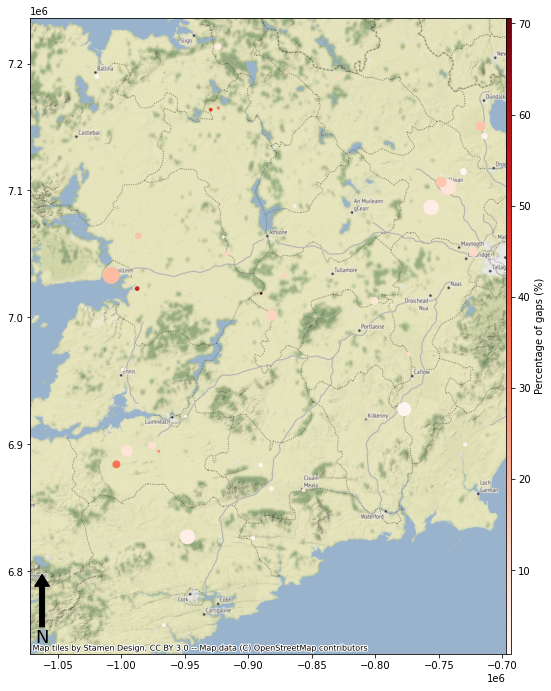

In [30]:
plot = plotgapsmap_withcircles(summarygapsstations = summarygapsstations[summarygapsstations.Country == "IE"],
                                       crsproj = 'epsg:4326', backmapproj = True, 
                                       figsizeproj = (11.7, 11.7), cmapproj = "Reds", legend_title = "Percentage of gaps (%)",
                                       legend_orientation = "vertical", pad_map = 0, markersize_map = summarygapsstations['area']/10,
                                       north_arrow = True, 
                                       set_map_limits = False, minx = -11, miny = 50, maxx = -6, maxy = 56)

#plot.savefig('world.jpg', bbox_inches='tight', dpi=300)
plot.show()

In [31]:
summarygapsstations

,CoordX,CoordY,NumGaps,PercentageGaps,geometry,Country,area
Code,,,,,,,
6118130,-4.362693,48.530410,2412.0,17.378774,POINT (-4.36269 48.53041),FR,24.0
6118150,-4.077011,48.615037,2399.0,17.285107,POINT (-4.07701 48.61504),FR,43.0
6118160,-3.924127,48.584822,2408.0,17.349953,POINT (-3.92413 48.58482),FR,141.0
6118165,0.580580,48.747942,3486.0,25.117083,POINT (0.58058 48.74794),FR,149.0
6118175,-3.800485,48.565562,2578.0,18.574825,POINT (-3.80049 48.56556),FR,44.0
...,...,...,...,...,...,...,...
6971130,31.750000,68.600000,2558.0,18.430723,POINT (31.75000 68.60000),RU,17500.0
6971600,36.300000,66.400000,2922.0,21.053390,POINT (36.30000 66.40000),RU,7940.0
6977100,44.585833,48.804722,3287.0,23.683262,POINT (44.58583 48.80472),RU,1360000.0


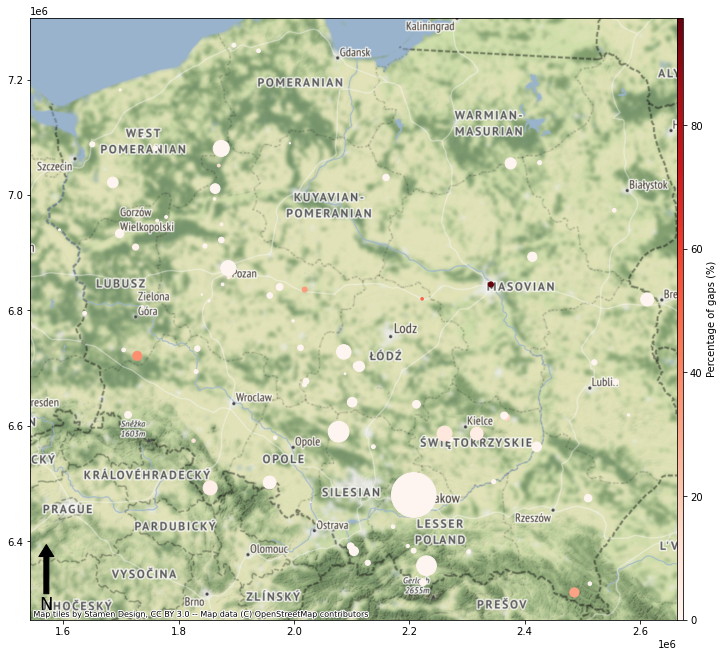

In [33]:
plot = plotgapsmap_withcircles(summarygapsstations = summarygapsstations[summarygapsstations.Country == "PL"],
                                       crsproj = 'epsg:4326', backmapproj = True, 
                                       figsizeproj = (11.7, 11.7), cmapproj = "Reds", legend_title = "Percentage of gaps (%)",
                                       legend_orientation = "vertical", pad_map = 0, markersize_map = summarygapsstations['area']/10,
                                       north_arrow = True, 
                                       set_map_limits = False, minx = -11, miny = 50, maxx = -6, maxy = 56)

#plot.savefig('world.jpg', bbox_inches='tight', dpi=300)
plot.show()

<AxesSubplot:xlabel='Code'>

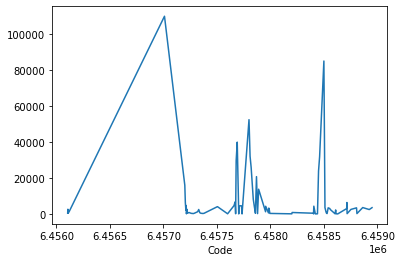

In [252]:
summarygapsstations[summarygapsstations.Country == "PL"].area.plot()

In [35]:
summarygapsstations[summarygapsstations.Country == "DE"].area

Code
6321100    1203.0
6321200    2105.0
6334270     352.0
6334280     134.0
6334800     481.0
            ...  
6357501    4080.0
6357502    1621.0
6357503     376.0
6357510     162.0
6357520    -999.0
Name: area, Length: 320, dtype: float64